# **SOCIAL DISTANCE DETECTION**

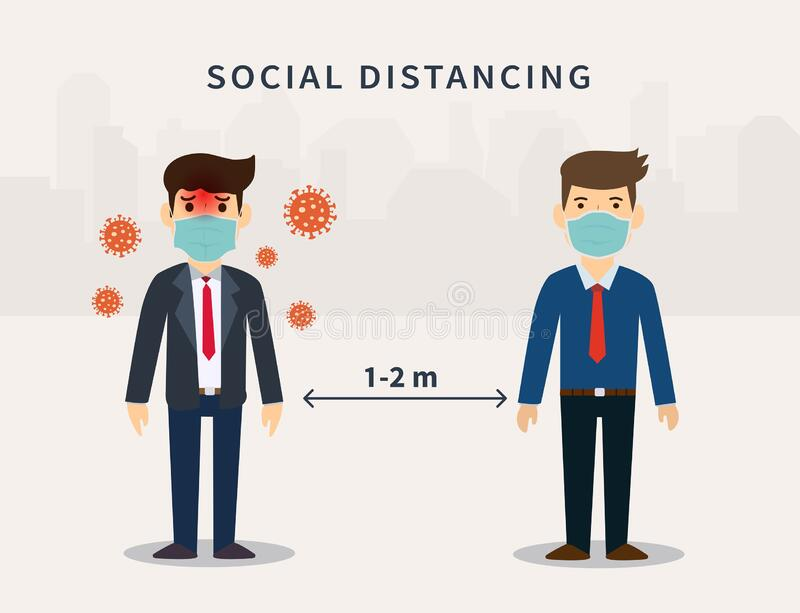

*Nowadays, social distance has become essential, whether in our neighborhood or a supermarket, we must keep a distance if we want to ensure our well-being. However, this is not something that 100% of the population complies, we propose an algorithm capable of detecting when the distance is infringed, calculating the distance between each individual to have a better control beyond what our eyes can monitor.*

# Mounting your Google Drive folder
To reduce file copy time

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive



Put the 'SocialDistancing' folder in the root of your Google Drive.

# Previous step
# Install Dependencies

In [ ]:
# import dependencies
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js
from google.colab.patches import cv2_imshow
from base64 import b64decode, b64encode
from tqdm.auto import tqdm
import os
import cv2
import numpy as np
import PIL
import io
import html
import time
import matplotlib.pyplot as plt
%matplotlib inline

# Step 1. Cloning and compiling Darknet from Jarvis_team repository
**About Darknet:** Darknet is a framework to train neural networks, it is open source and written in C/CUDA and serves as the basis for YOLO.
Darknet is one of the most famous frameworks that works with YOLO so it make easier to understand the procedure.
Hence, we retrain a model with its own dataset, for the detection of people.

In [ ]:
# clone Jarvis darknet repo
!git clone https://github.com/Skillz712/Jarvis-Darknet

Cloning into 'Jarvis-Darknet'...
remote: Enumerating objects: 17, done.
remote: Counting objects: 100% (17/17), done.
remote: Compressing objects: 100% (15/15), done.
remote: Total 17 (delta 0), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (17/17), done.


In [ ]:
%cd Jarvis-Darknet

/content/Jarvis-Darknet


In [ ]:
!unzip Jarvis-Darknet

Archive:  Jarvis-Darknet.zip
   creating: results/
 extracting: results/tmp.txt         
   creating: scripts/
  inflating: scripts/deploy-cuda.ps1  
  inflating: scripts/deploy-cuda.sh  
  inflating: scripts/dice_label.sh   
  inflating: scripts/download_weights.ps1  
  inflating: scripts/gen_anchors.py  
  inflating: scripts/gen_tactic.sh   
  inflating: scripts/get_coco2017.sh  
  inflating: scripts/get_coco_dataset.sh  
  inflating: scripts/get_imagenet_train.sh  
  inflating: scripts/get_openimages_dataset.py  
  inflating: scripts/imagenet_label.sh  
  inflating: scripts/install_OpenCV4.sh  
  inflating: scripts/kitti2yolo.py   
  inflating: scripts/kmeansiou.c     
   creating: scripts/log_parser/
  inflating: scripts/log_parser/log_parser.py  
  inflating: scripts/log_parser/plot.jpg  
  inflating: scripts/log_parser/readme.md  
  inflating: scripts/log_parser/run_log_parser_windows.cmd  
  inflating: scripts/log_parser/test.log  
  inflating: scripts/log_parser/test_new.log  


# Step 2. Prepare the workspace
Change makefile to have GPU, OPENCV and LIBSO enabled



In [ ]:

!sed -i 's/OPENCV=0/OPENCV=1/' Makefile
!sed -i 's/GPU=0/GPU=1/' Makefile
!sed -i 's/CUDNN=0/CUDNN=1/' Makefile
!sed -i 's/CUDNN_HALF=0/CUDNN_HALF=1/' Makefile
!sed -i 's/LIBSO=0/LIBSO=1/' Makefile

#Step 3. Make Darknet

To use the darknet.py file and have its dependencies

In [ ]:
!make

mkdir -p ./obj/
mkdir -p backup
chmod +x *.sh
g++ -std=c++11 -std=c++11 -Iinclude/ -I3rdparty/stb/include -DOPENCV `pkg-config --cflags opencv4 2> /dev/null || pkg-config --cflags opencv` -DGPU -I/usr/local/cuda/include/ -DCUDNN -DCUDNN_HALF -Wall -Wfatal-errors -Wno-unused-result -Wno-unknown-pragmas -fPIC -Ofast -DOPENCV -DGPU -DCUDNN -I/usr/local/cudnn/include -DCUDNN_HALF -fPIC -c ./src/image_opencv.cpp -o obj/image_opencv.o
./src/image_opencv.cpp: In function ‘void draw_detections_cv_v3(void**, detection*, int, float, char**, image**, int, int)’:
./src/image_opencv.cpp:935:23: warning: variable ‘rgb’ set but not used [-Wunused-but-set-variable]
                 float rgb[3];
                       ^~~
./src/image_opencv.cpp: In function ‘void draw_train_loss(char*, void**, int, float, float, int, int, float, int, char*, float, int, int, double)’:
./src/image_opencv.cpp:1136:13: warning: this ‘if’ clause does not guard... [-Wmisleading-indentation]
             if (iteration_old ==

#Step 4. Copy "SocialDistancing.weights" into the Darknet folder:

In [ ]:
!cp "/content/drive/MyDrive/SocialDistancing/SocialDistancing.weights" -r "/content/Jarvis-Darknet"

## Step 5. We will use some of the pre-built functions 
We import the functions from the darknet.py file.Then load in our Yolov4 architecture network 

In [ ]:
from darknet import *
network, class_names, class_colors = load_network("cfg/yolov4.cfg", "cfg/coco.data", "SocialDistancing.weights")
width = network_width(network)
height = network_height(network)

Darknet helper help us to start the detection

In [ ]:
def darknet_helper(img, width, height):
  darknet_image = make_image(width, height, 3)
  img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img_resized = cv2.resize(img_rgb, (width, height),
                              interpolation=cv2.INTER_LINEAR)

  # Get image ratios to convert bounding boxes to proper size
  img_height, img_width, _ = img.shape
  width_ratio = img_width/width
  height_ratio = img_height/height

  # Run model on darknet style image to get detections
  copy_image_from_bytes(darknet_image, img_resized.tobytes())
  detections = detect_image(network, class_names, darknet_image)
  free_image(darknet_image)
  return detections, width_ratio, height_ratio

# Step 6. Copy sort.py (Simple Object Real-time Tracking) and socialdistancing.pyc

In [ ]:
!cp "/content/drive/MyDrive/SocialDistancing/sort.py" -r "/content/Jarvis-Darknet"

Copy "socialdistancing.pyc" into the Darknet folder:

In [ ]:
!cp "/content/drive/MyDrive/SocialDistancing/socialdistancing.pyc" -r "/content/Jarvis-Darknet"

In [ ]:
!pip install filterpy
from sort import *
mot_tracker    = Sort(max_age=25, min_hits=4, iou_threshold=0.3)

     |████████████████████████████████| 184kB 35.4MB/s 
  Created wheel for filterpy: filename=filterpy-1.4.5-cp37-none-any.whl size=110476 sha256=49e5b7ffecf3366fa2d8e1fc17b3854c3382c182be1a50830b4e1e3a0a4506ed
  Stored in directory: /root/.cache/pip/wheels/c3/0c/dd/e92392c3f38a41371602d99fc77d6c1d42aadbf0c6afccdd02
Successfully built filterpy


# Step 7.We select the input video



We can import any of the test videos from drive but first we create a folder to store the input videos and the output videos which show the detection




In [ ]:
%cd /content/Jarvis-Darknet/
!mkdir videoinput

/content/Jarvis-Darknet


In [ ]:
%cd /content/Jarvis-Darknet/
!mkdir videooutput

/content/Jarvis-Darknet


For the first test we import video1 from drive and store it in our input videos folder

In [ ]:
!cp "/content/drive/MyDrive/SocialDistancing/video1.avi" -r "/content/Jarvis-Darknet/videoinput"

In [ ]:
Input            = "./videoinput/video1.avi"
ReductionFactor  = 2
calibration      = [[180,162],[618,0],[552,540],[682,464]]

#Step 8. We define the initial settings for detection

In [ ]:
from socialdistancing import *

# Frame Duration 
Start  = 0 
Finish  = 500
# Time for considering as a couple (per Frame)
TimeCrowd = 25

# 0 = DISABLE, 1 = ENABLE
# Ignore people detection in the edges of the video
SuprEdges = 1  
# Crowd Detection
CDetection  = 1
# Detection
Detect  = 1
# Social Distance
SocialDistance  = 1
#Crowd Map
CrowdMap = 1

# Values In Pixels
# The 28 value is approx to 1 meter accord to perspective relation in the video input
ViolationDistInd = 40
# (Forward, Behind) per Pixel
#DistCrowd = (16 , 10)   
DistCrowd = (150,40) 
# HumanHeightLimit 
# Ignore people with unusual heights
HHL = 300             

# Output Video's path
Detection_Path = os.getcwd() + "/videooutput/SDD.avi"
CrowdDetect_Map = os.getcwd() + "/videooutput/Crowd_Map.avi"

#Step 9. Functions that will aid detection

In [ ]:
# Define the centroid position of a box
def centroid(detections, image, calibration, _centroid_dict, SuprEdges, HHL):
    e = birds_eye(image.copy(), calibration)
    centroid_dict = dict()
    now_present = list()
    if len(detections) > 0:   
        for d in detections:
            p = int(d[4])
            now_present.append(p)
            xmin, ymin, xmax, ymax = d[0], d[1], d[2], d[3]
            w = xmax - xmin
            h = ymax - ymin
            x = xmin + w/2
            y = ymax - h/2
            if h < HHL:
                overley = e.image
                bird_x, bird_y = e.projection_on_bird((x, ymax))
                if SuprEdges:
                    if checkupArea(overley, 1, 0.25, (x, ymin)):
                        continue
                e.setImage(overley)
                center_bird_x, center_bird_y = e.projection_on_bird((x, ymin))
                centroid_dict[p] = (
                            int(bird_x), int(bird_y),
                            int(x), int(ymax), 
                            int(xmin), int(ymin), int(xmax), int(ymax),
                            int(center_bird_x), int(center_bird_y))

                _centroid_dict[p] = centroid_dict[p]
    return _centroid_dict, centroid_dict, e.image

# Return if a detection exists
def fit_person(detections):
    detected = []
    if len(detections) > 0: 
        idList = []
        id = 0
        for label, confidence, bbox in detections:
            if label == 'person': 
                xmin, ymin, xmax, ymax = bbox2points(bbox)
                id +=1
                if id not in idList: idList.append(id)
                detected.append([int(xmin), int(ymin), int(xmax), int(ymax), idList[-1]])
    return np.array(detected)

# Show the results
def VisualiseResult(_Map, e):
    Map = np.uint8(_Map)
    histMap = e.convrt2Image(Map)
    visualBird = cv2.applyColorMap(np.uint8(_Map), cv2.COLORMAP_JET)
    visualMap = e.convrt2Image(visualBird)
    visualShow = cv2.addWeighted(e.original, 0.7, visualMap, 1 - 0.7, 0)
    return visualShow, visualBird, histMap

# Step 10. Capture the video inpu



In this section we will increase the detection speed based on the reduction factor



In [ ]:
from tqdm.auto import tqdm
cap = cv2.VideoCapture(Input)
frame_width = int(cap.get(3))
frame_height = int(cap.get(4))
height, width = frame_height // ReductionFactor, frame_width // ReductionFactor
print("Video Resolution: ",(width, height))
count=0
loop = tqdm(total=393,position=0,leave=False)
k=0

if Detect: DetectionVideo = cv2.VideoWriter(Detection_Path, cv2.VideoWriter_fourcc(*"MJPG"), 30.0, (width, height))

if CrowdMap: CrowdVideo = cv2.VideoWriter(CrowdDetect_Map, cv2.VideoWriter_fourcc(*"XVID"), 30.0, (width, height))

_greenZone = list()
_redZone = list()
_yellowZone = list()
_centroid_dict = dict()
_relation = dict()
_couples = dict()
_trackMap = np.zeros((height, width, 3), dtype=np.uint8)
_crowdMap = np.zeros((height, width), dtype=np.int) 
_allPeople = 0
_counter = 1
frame = 0

while True:
    loop.set_description("Detecting...",format(frame))
    loop.update(1)
    #print('-- Frame : {}'.format(frame))
    k=k+1
    prev_time = time.time()
    ret, frame_read = cap.read()
    if not ret: break

    frame += 1
    if frame <= Start: continue
    if frame != -1:
       if frame > Finish: break
        
    frame_resized = cv2.resize(frame_read,(width, height), interpolation=cv2.INTER_LINEAR)
    image = frame_resized
    e = birds_eye(image, calibration)
    detections, width_ratio, height_ratio = darknet_helper(image, width, height)
    humans = fit_person(detections)
    track_bbs_ids = mot_tracker.update(humans) if len(humans) != 0 else humans

    _centroid_dict, centroid_dict, partImage = centroid(track_bbs_ids, image, calibration, _centroid_dict, SuprEdges, HHL)
    redZone, greenZone = find_zone(centroid_dict, _greenZone, _redZone, criteria=ViolationDistInd)
    
    #For the detection of people who are less than 1 meter
    if CDetection:
        _relation, relation = find_relation(e, centroid_dict, DistCrowd, redZone, _couples, _relation)
        _couples, couples, coupleZone = find_couples(image, _centroid_dict, relation, TimeCrowd, _couples)
        
    else:
        couples = []
        coupleZone = []

    # for the detection of people and frame them in different colors to see if they are in danger
    if Detect:
        DTC_image = image.copy()
        DTCShow = DTC_image


        for id, box in centroid_dict.items():
            center_bird = box[0], box[1]
            if not id in coupleZone:
                cv2.rectangle(DTCShow,(box[4], box[5]),(box[6], box[7]),(239,255,0),2)                
                cv2.putText(DTCShow,'SAFE',(box[4]+2, box[5]-2),cv2.FONT_HERSHEY_SIMPLEX,.5,(239,255,0),1,cv2.LINE_AA)
        for coupled in couples:
            
            p1 , p2 = coupled
            couplesID = couples[coupled]['id']
            couplesBox = couples[coupled]['box']
            cv2.rectangle(DTCShow, couplesBox[2:4], couplesBox[4:], (0,0,255), 4)
            loc = couplesBox[0] , couplesBox[3]
            offset = len(str(couplesID)*5)
            captionBox = (loc[0] - offset, loc[1]-13), (loc[0] + offset, loc[1])
            wc = captionBox[1][0] - captionBox[0][0]
            hc = captionBox[1][1] - captionBox[0][1]
            cx = captionBox[0][0] + wc // 2
            cy = captionBox[0][1] + hc // 2

            warning = (cx - offset - 20, cy + 4)

            cv2.putText(DTCShow, 'WARNING!' ,(warning),cv2.FONT_HERSHEY_SIMPLEX,.5,(0,0,255),1,cv2.LINE_AA)
            cv2.putText(DTCShow, str(count) , (800,500),cv2.FONT_HERSHEY_SIMPLEX,2,(0,0,255),4,cv2.LINE_AA)
            if couplesID:
              count=count+1
            cv2.putText(DTCShow, 'WARNING: <1m' , (20,485),cv2.FONT_HERSHEY_SIMPLEX,1,(0,0,255),4,cv2.LINE_AA)
            cv2.putText(DTCShow, 'SAFE: >1m' , (20,520),cv2.FONT_HERSHEY_SIMPLEX,1,(239,255,0),4,cv2.LINE_AA)

        DetectionVideo.write(DTCShow)
    #For detection with the aid of the crowd map
    if CrowdMap:
        _crowdMap, crowdMap = Apply_crowdMap(centroid_dict, image, _crowdMap)
        crowd = (crowdMap - crowdMap.min()) / (crowdMap.max() - crowdMap.min())*255
        crowd_visualShow, crowd_visualBird, crowd_histMap = VisualiseResult(crowd, e)
        cv2.putText(DTCShow, 'INFECTION MAP *' , (20,485),cv2.FONT_HERSHEY_SIMPLEX,1,(0,0,255),4,cv2.LINE_AA)
        CrowdVideo.write(crowd_visualShow)
    
    cv2.waitKey(3)

print('::: Analysis Completed!')

cap.release()
if Detect: DetectionVideo.release(); print("::: Video Write Done! : ", Detection_Path)
if CrowdMap: CrowdVideo.release() ; print("::: Video Write Done! : ", CrowdDetect_Map)

Video Resolution:  (960, 540)


::: Analysis Completed!
::: Video Write Done! :  /content/Jarvis-Darknet/videooutput/SDD.avi
::: Video Write Done! :  /content/Jarvis-Darknet/videooutput/Crowd_Map.avi


#Step 11. Conversion of detection videos

Convert from avi to mp4  to play the videos

In [ ]:
%cd videooutput 
!ffmpeg -i SDD.avi Detection.mp4
!ffmpeg -i Crowd_Map.avi Crowd_Map.mp4

/content/Jarvis-Darknet/videooutput
ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-l

In [ ]:
# Play the output video
from IPython.display import HTML
from base64 import b64encode
#video1 
mp41 = open('Crowd_Map.mp4','rb').read()
data_url1 = "data:video/mp4;base64," + b64encode(mp41).decode()
#video2
mp42 = open('Detection.mp4','rb').read()
data_url2 = "data:video/mp4;base64," + b64encode(mp42).decode()

## Step 12.Viewing the output videos

##Crowdmap video

In [ ]:
HTML("""
<video width=960 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url1)

## Detection video

In [ ]:
HTML("""
<video width=960 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url2)